## Analyse exploratoire des données immobilières (2021-2025)

### Introduction

Cette analyse exploratoire porte sur les transactions immobilières françaises entre 2021 et 2025, 
enrichies de données socio-économiques (fiscalité, démographie, emploi).

L'objectif est de comprendre les dynamiques du marché immobilier français à l'échelle du code postal, 
en identifiant les facteurs qui influencent la tendance des prix (hausse, baisse, stable).


### Variables principales
- **Prix au m²** : indicateur central du marché immobilier
- **Variables fiscales** : taux de taxe foncière bâtie, non bâtie, taxe d'habitation
- **Variables démographiques** : population, superficie
- **Variables emploi** : emploi total
- **Variable cible `y`** : tendance du marché (hausse / baisse / stable) calculée par rapport à l'inflation


## 1. Import des librairies / modules

Cette section importe l'ensemble des bibliothèques nécessaires à l'analyse :

In [86]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import os
import plotly.express as px
import joblib
import requests
from sklearn.preprocessing import LabelEncoder
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

## 2. Chargement et premier aperçu des données

On charge le fichier csv_full.csv qui contient les données immobilières enrichies (prix au m², fiscalité, démographie) par commune et par année.

In [108]:
df = pd.read_csv(r'../merge/raw/csv_full_post.csv', sep=';')
df_eda = df.copy()

# Aperçu rapide
print(f"Dimensions : {df.shape[0]:,} lignes × {df.shape[1]} colonnes")
print(f"\nAnnées disponibles :\n{df_eda['annee'].value_counts().sort_index()}")
print(f"\nVariable cible :\n{df_eda['y'].value_counts()}")

df.head(5)

Dimensions : 161,708 lignes × 33 colonnes

Années disponibles :
annee
2021    32957
2022    32944
2023    32837
2024    32711
2025    30259
Name: count, dtype: int64

Variable cible :
y
hausse    70198
baisse    64239
stable     9197
Name: count, dtype: int64


C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_10236\686376548.py:1: DtypeWarning: Columns (1,3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r'../merge/raw/csv_full_post.csv', sep=';')


,annee,code_commune,prix_m2,dep_code,dep_nom,reg_code,reg_nom,code_postal,population,superficie_km2,...,Construction,part_tertiaire_marchand,part_tertiaire_non_marchand,region,admin_sante,commerces_malls,education,loisirs_verts,transports_rails,taux_inflation
0,2021,1001,2570.672952,1,Ain,84.0,Auvergne-Rhône-Alpes,1400.0,779.0,16.0,...,6.0,48.0,30.0,Auvergne-Rhône-Alpes,4567.0,2136.0,10859.0,5261.0,1328.0,0.034
1,2022,1001,2930.586507,1,Ain,84.0,Auvergne-Rhône-Alpes,1400.0,779.0,16.0,...,6.0,48.0,30.0,Auvergne-Rhône-Alpes,4567.0,2136.0,10859.0,5261.0,1328.0,0.067
2,2023,1001,3220.607801,1,Ain,84.0,Auvergne-Rhône-Alpes,1400.0,806.0,16.0,...,6.0,48.0,30.0,Auvergne-Rhône-Alpes,4567.0,2136.0,10859.0,5261.0,1328.0,0.041
3,2024,1001,3248.685531,1,Ain,84.0,Auvergne-Rhône-Alpes,1400.0,806.0,16.0,...,6.0,48.0,30.0,Auvergne-Rhône-Alpes,4567.0,2136.0,10859.0,5261.0,1328.0,0.018
4,2025,1001,2890.639061,1,Ain,84.0,Auvergne-Rhône-Alpes,1400.0,832.0,16.0,...,6.0,48.0,30.0,Auvergne-Rhône-Alpes,4567.0,2136.0,10859.0,5261.0,1328.0,0.007


Le dataset contient **161708 observations** réparties sur **5 années** (2021-2025) et **33 variables**.

In [88]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161708 entries, 0 to 161707
Data columns (total 33 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   annee                        161708 non-null  int64  
 1   code_commune                 161708 non-null  object 
 2   prix_m2                      150822 non-null  float64
 3   dep_code                     161639 non-null  object 
 4   dep_nom                      161639 non-null  object 
 5   reg_code                     161639 non-null  float64
 6   reg_nom                      161639 non-null  object 
 7   code_postal                  161638 non-null  float64
 8   population                   161708 non-null  float64
 9   superficie_km2               161708 non-null  float64
 10  zone_emploi                  161458 non-null  float64
 11  taux_global_tfb              161639 non-null  float64
 12  taux_global_tfnb             161639 non-null  float64
 13 

## 3. Qualité des données

In [89]:
df_eda.columns

Index(['annee', 'code_commune', 'prix_m2', 'dep_code', 'dep_nom', 'reg_code',
       'reg_nom', 'code_postal', 'population', 'superficie_km2', 'zone_emploi',
       'taux_global_tfb', 'taux_global_tfnb', 'taux_plein_teom',
       'taux_global_th', 'nb_ventes', 'variation', 'y', 'emploi_total',
       'emploi_non_salarie', 'emploi_salarie', 'part_agriculture',
       'part_industrie', 'Construction ', 'part_tertiaire_marchand',
       'part_tertiaire_non_marchand', 'region', 'admin_sante',
       'commerces_malls', 'education', 'loisirs_verts', 'transports_rails',
       'taux_inflation'],
      dtype='object')

In [90]:
df_eda.columns = df_eda.columns.str.strip()
print(df_eda.columns.tolist())

['annee', 'code_commune', 'prix_m2', 'dep_code', 'dep_nom', 'reg_code', 'reg_nom', 'code_postal', 'population', 'superficie_km2', 'zone_emploi', 'taux_global_tfb', 'taux_global_tfnb', 'taux_plein_teom', 'taux_global_th', 'nb_ventes', 'variation', 'y', 'emploi_total', 'emploi_non_salarie', 'emploi_salarie', 'part_agriculture', 'part_industrie', 'Construction', 'part_tertiaire_marchand', 'part_tertiaire_non_marchand', 'region', 'admin_sante', 'commerces_malls', 'education', 'loisirs_verts', 'transports_rails', 'taux_inflation']


In [91]:
df_eda = df_eda[df_eda['code_commune'].astype(str).str.match(r'^\d+$')]
df_eda = df_eda[df_eda['dep_code'].astype(str).str.match(r'^\d+$')]

df_eda['code_commune'] = df_eda['code_commune'].astype(int)
df_eda['dep_code'] = df_eda['dep_code'].astype(int)

In [92]:
# Correction des types et nettoyage des variables [emploi_total, emploi_salarie, emploi_non_salarie]

df_eda['emploi_total'] = df_eda['emploi_total'].astype(str).str.replace(',', '').str.strip()
df_eda['emploi_total'] = pd.to_numeric(df_eda['emploi_total'], errors='coerce') * 1000

df_eda['emploi_salarie'] = df_eda['emploi_salarie'].astype(str).str.replace(',', '').str.strip()
df_eda['emploi_salarie'] = pd.to_numeric(df_eda['emploi_salarie'], errors='coerce') * 1000

df_eda['emploi_non_salarie'] = df_eda['emploi_non_salarie'] * 1000

if 'Construction' in df_eda.columns:
    df_eda = df_eda.rename(columns={'Construction': 'part_construction'})
    

### 3.1 Analyse des valeurs manquantes

On identifie les colonnes avec des valeurs manquantes et on évalue leur proportion.

In [81]:
missing = df_eda.isnull().sum().sort_values(ascending=False)
missing_pct = (missing / len(df_eda) * 100).round(2)

missing_df = pd.DataFrame({
    'nb_manquants': missing,
    'pct_manquants': missing_pct
})
missing_df[missing_df['nb_manquants'] > 0]

,nb_manquants,pct_manquants
taux_plein_teom,3115,7.35


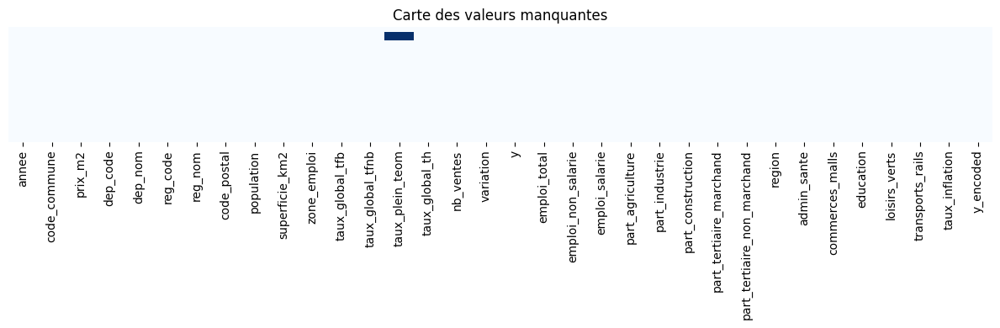

In [82]:
# Heatmap des valeurs manquantes
plt.figure(figsize=(12, 4))
sns.heatmap(df_eda.isnull(), cbar=False, yticklabels=False, cmap='Blues')
plt.title('Carte des valeurs manquantes')
plt.tight_layout()
plt.show()

Les lignes avec `y` manquant seront supprimées car elles ne peuvent pas être utilisées pour la modélisation.

In [83]:
df_eda = df_eda.dropna(subset=['y', 'prix_m2']).reset_index(drop=True)
print(f"Dimensions après nettoyage : {df_eda.shape}")
print(f"\nVariable cible :\n{df_eda['y'].value_counts()}")

Dimensions après nettoyage : (42370, 34)

Variable cible :
y
hausse    20730
baisse    18848
stable     2792
Name: count, dtype: int64


### 3.2 Doublons

In [84]:
print(f"Doublons totaux : {df_eda.duplicated().sum()}")

# Doublons sur la clé (commune × année)
n_dup_key = df_eda.duplicated(subset=['annee', 'code_commune']).sum()
print(f"Doublons sur (annee, code_commune) : {n_dup_key}")

if n_dup_key > 0:
    dup_ex = df_eda[df_eda.duplicated(subset=['annee', 'code_commune'], keep=False)].sort_values(['code_commune','annee'])
    display(dup_ex.head(10))


Doublons totaux : 0
Doublons sur (annee, code_commune) : 0


### 3.3 Détection des outliers — prix au m²

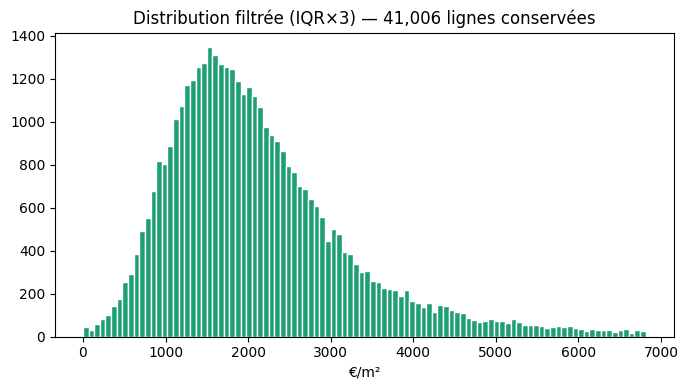

In [85]:
# Filtre IQR
Q1 = df['prix_m2'].quantile(0.25)
Q3 = df['prix_m2'].quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 3 * IQR
upper = Q3 + 3 * IQR

df_clean = df_eda[(df_eda['prix_m2'] >= lower) & (df_eda['prix_m2'] <= upper)].copy()

# Un seul plot
plt.figure(figsize=(7, 4))
plt.hist(df_clean['prix_m2'].dropna(), bins=100, color='#1D9E75', edgecolor='white')

plt.title(f"Distribution filtrée (IQR×3) — {len(df_clean):,} lignes conservées")
plt.xlabel("€/m²")

plt.tight_layout()
plt.show()

## 4. EDA

### 4.1  Variable cible : y (hausse / baisse / stable)

La variable cible de notre classification représente la tendance du marché immobilier pour chaque commune.  
Voici la répartition des classes dans notre jeu de données :

In [93]:
df_counts = df_eda['y'].value_counts().reset_index()
df_counts.columns = ['Classe', 'Nombre']

fig = px.pie(
    df_counts,
    names='Classe',
    values='Nombre',
    hole=0.45, 
    color='Classe',
color_discrete_map={
    'stable': '#4CAF50', 
    'baisse': '#F44336',   
    'hausse': '#2196F3'  
}
)

fig.update_traces(
    textinfo='percent+label',
    textfont_size=14,
    marker=dict(line=dict(color='#FFFFFF', width=2)) 
)

fig.update_layout(
    title={
        'text': "Répartition de la variable cible",
        'x': 0.5,  
        'xanchor': 'center',
        'font': dict(size=20)
    },
    legend_title="Classe",
    template="plotly_white",  
)

fig.show()

Le marché immobilier français est fortement divisé entre hausse (44.7.9%) et baisse (48.9%), avec très peu de zones stables (6.4%). La classe `stable` est sous-représentée, ce qui devra être pris en compte lors de la modélisation.

#### Statistiques descriptives & distributions

In [66]:
df_eda.columns

Index(['annee', 'code_postal', 'prix_m2', 'dep_code', 'dep_nom', 'reg_code',
       'reg_nom', 'population', 'superficie_km2', 'zone_emploi',
       'taux_global_tfb', 'taux_global_tfnb', 'taux_plein_teom',
       'taux_global_th', 'nb_ventes', 'variation', 'taux_inflation', 'y',
       'emploi_total', 'emploi_non_salarie', 'emploi_salarie',
       'part_agriculture', 'part_industrie', 'part_construction',
       'part_tertiaire_marchand', 'part_tertiaire_non_marchand'],
      dtype='str')

In [67]:
num_cols = ['prix_m2', 'population', 'superficie_km2',
            'nb_ventes', 'taux_global_tfb', 'taux_global_tfnb',
            'taux_plein_teom', 'taux_global_th']

df_eda[num_cols].describe().T.style.background_gradient(cmap='Blues', subset=['mean','std'])

,count,mean,std,min,25%,50%,75%,max
prix_m2,28622.000000,8901.912756,86132.173776,0.016393,1670.428395,2386.688641,3859.151192,4747904.280777
population,28669.000000,11235.037183,20140.670447,0.000000,3035.000000,6066.000000,11879.000000,504078.000000
superficie_km2,28669.000000,100.852000,323.523136,0.000000,21.000000,64.000000,138.000000,18718.000000
nb_ventes,28669.000000,629.172137,1059.643953,1.000000,184.000000,388.000000,743.000000,53814.000000
taux_global_tfb,28665.000000,49.905204,9.730683,14.080000,44.930000,49.050000,54.860000,80.050000
taux_global_tfnb,28665.000000,105.631935,50.640422,19.730000,71.510000,90.450000,125.780000,381.740000
taux_plein_teom,27257.000000,10.010147,3.068780,4.150000,8.100000,9.800000,11.190000,24.500000
taux_global_th,28665.000000,31.372925,6.525732,8.800000,27.470000,30.970000,34.280000,48.030000


### 4.2  Évolution de la tendance du marché immobilier par année (2021-2025)

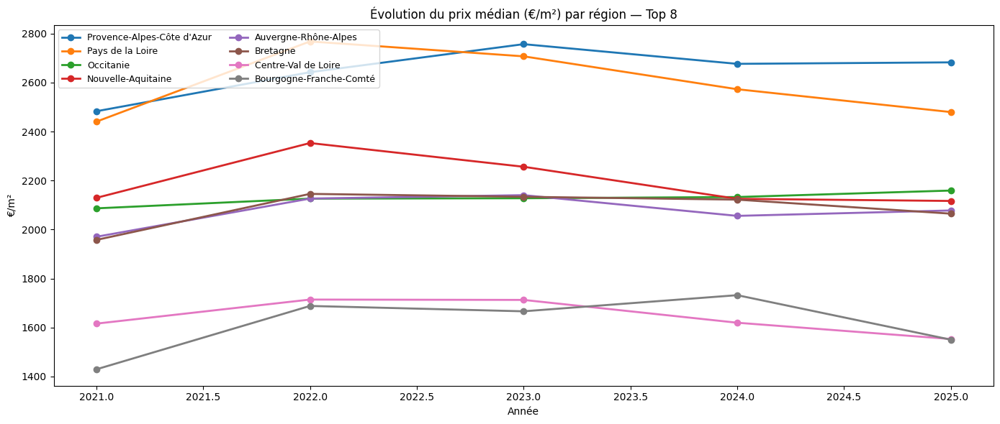

In [94]:
pivot = df_clean.groupby(['annee', 'reg_nom'])['prix_m2'].median().unstack()
top8 = pivot.loc[2025].sort_values(ascending=False).head(8).index

fig, ax = plt.subplots(figsize=(14, 6))
for i, reg in enumerate(top8):
    ax.plot(pivot.index, pivot[reg], marker='o', label=reg, color=PALETTE[i % len(PALETTE)], linewidth=2)
ax.set_title("Évolution du prix médian (€/m²) par région — Top 8")
ax.set_ylabel("€/m²")
ax.set_xlabel("Année")
ax.legend(loc='upper left', fontsize=9, ncol=2)
plt.tight_layout()
plt.show()


In [95]:
df_y_annee = df_eda.groupby(['annee', 'y']).size().reset_index(name='count')
df_y_annee['pct'] = df_y_annee.groupby('annee')['count'].transform(lambda x: x / x.sum() * 100).round(1)

fig = px.bar(
    df_y_annee,
    x='annee',
    y='pct',
    color='y',
    barmode='group',
    color_discrete_map={
        'stable': '#4CAF50',
        'baisse': '#F44336',
        'hausse': '#2196F3'
    },
    title="Répartition de la tendance du marché par année",
    labels={'pct': 'Pourcentage (%)', 'annee': 'Année', 'y': 'Tendance'}
)

fig.show()

On observe un changement net de dynamique sur la période :
- 2021–2022 : marché en forte hausse (≈61% en 2021, ≈50% en 2022)
- À partir de 2023 : inversion de tendance, la baisse devient dominante (~47%)

In [33]:
df_eda.columns

Index(['annee', 'code_commune', 'prix_m2', 'dep_code', 'dep_nom', 'reg_code',
       'reg_nom', 'code_postal', 'population', 'superficie_km2', 'zone_emploi',
       'taux_global_tfb', 'taux_global_tfnb', 'taux_plein_teom',
       'taux_global_th', 'nb_ventes', 'variation', 'y', 'emploi_total',
       'emploi_non_salarie', 'emploi_salarie', 'part_agriculture',
       'part_industrie', 'part_construction', 'part_tertiaire_marchand',
       'part_tertiaire_non_marchand', 'region', 'admin_sante',
       'commerces_malls', 'education', 'loisirs_verts', 'transports_rails',
       'taux_inflation'],
      dtype='object')

### 4.3 Comparaison des moyennes par classe pour les différentes variables

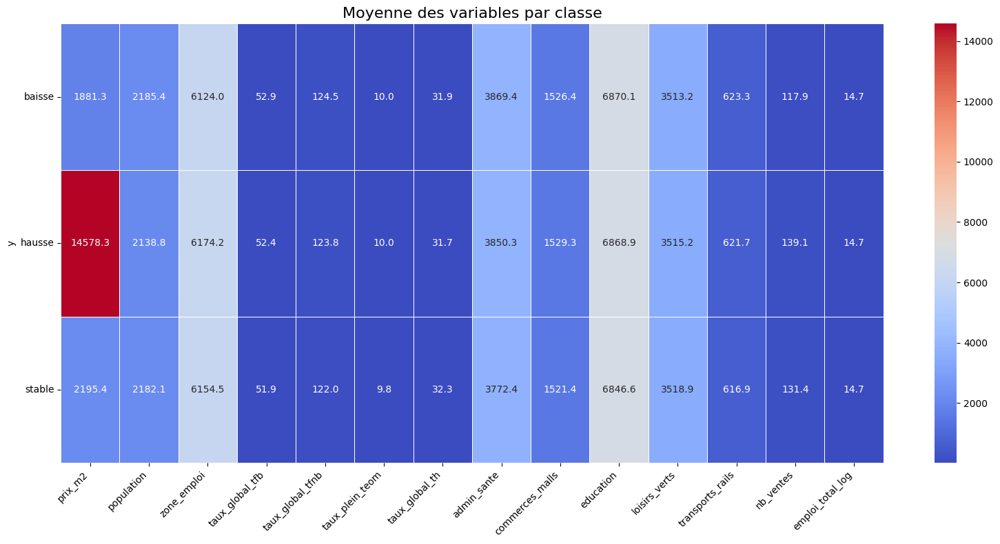

In [96]:
num_cols = [ 'prix_m2','population', 'zone_emploi',
       'taux_global_tfb', 'taux_global_tfnb', 'taux_plein_teom',
       'taux_global_th',  'emploi_total','admin_sante',
       'commerces_malls', 'education', 'loisirs_verts', 'transports_rails','nb_ventes']

grouped = df_eda.groupby('y')[num_cols].mean()

grouped['emploi_total_log'] = np.log1p(grouped['emploi_total'])

plt.figure(figsize=(16,8))
sns.heatmap(
    grouped.drop(columns=['emploi_total']), 
    annot=True,
    fmt=".1f", 
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='white'
)
plt.title("Moyenne des variables par classe", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

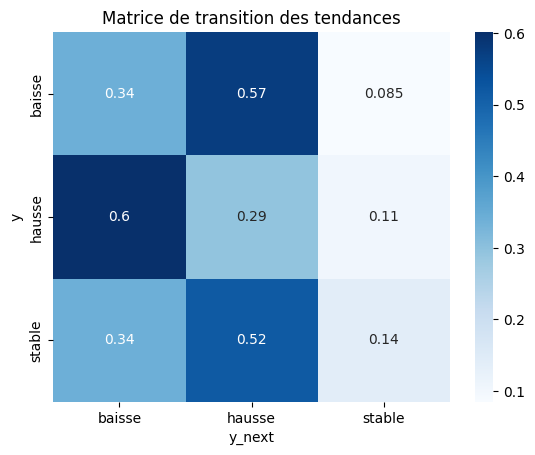

In [86]:
df_transition = df_eda.sort_values(['code_postal', 'annee'])

df_transition['y_next'] = df_transition.groupby('code_postal')['y'].shift(-1)

transition_matrix = pd.crosstab(df_transition['y'], df_transition['y_next'], normalize='index')

sns.heatmap(transition_matrix, annot=True, cmap='Blues')
plt.title("Matrice de transition des tendances")
plt.show()

In [94]:
# Vérifier si des valeurs infinies
print(np.isinf(df_eda[num_cols]).sum())

# Vérifier NaN
print(df_eda[num_cols].isna().sum())

prix_m2                0
nb_ventes              0
population             0
superficie_km2         0
emploi_total           0
taux_global_tfb        0
taux_global_tfnb       0
taux_plein_teom        0
taux_global_th         0
emploi_ratio           1
ventes_par_habitant    5
dtype: int64
prix_m2                  47
nb_ventes                 0
population                0
superficie_km2            0
emploi_total              4
taux_global_tfb           4
taux_global_tfnb          4
taux_plein_teom        1412
taux_global_th            4
emploi_ratio              4
ventes_par_habitant       0
dtype: int64


In [100]:
num_cols = [
    'prix_m2', 'nb_ventes', 
    'population', 'superficie_km2',
    'emploi_total','taux_global_tfb', 'taux_global_tfnb', 'taux_plein_teom', 'taux_global_th',
]
X_cluster = df_eda[num_cols].dropna()

In [107]:
corr = df_eda[['nb_ventes', 'prix_m2']].corr().loc['nb_ventes', 'prix_m2']
print(f"Coefficient de corrélation entre nb_ventes et prix_m2 : {corr:.3f}")

Coefficient de corrélation entre nb_ventes et prix_m2 : 0.120


#### Nombre de ventes et prix moyen par année et par département

In [14]:
df = df.dropna(subset=['dep_code', 'nb_ventes', 'prix_m2', 'annee'])
df['dep_code'] = df['dep_code'].astype(str).str.zfill(2)
df['annee'] = df['annee'].astype(int)

df_dep = df.groupby(['dep_code', 'annee'], as_index=False).agg(
    Département=('dep_nom', 'first'),  
    nb_ventes=('nb_ventes', 'sum'),
    prix_m2=('prix_m2', 'mean')
)

geojson_url = "https://france-geojson.gregoiredavid.fr/repo/departements.geojson"
geojson_data = requests.get(geojson_url).json()

fig = px.choropleth(
    df_dep,
    geojson=geojson_data,
    locations='dep_code',
    featureidkey="properties.code",
    color='nb_ventes',
    animation_frame='annee',        
    color_continuous_scale="Blues",
    hover_data={
        'Département': True,
        'nb_ventes': True,
        'prix_m2': ':.2f',
        'dep_code': False,
        'annee': False
    },
    range_color=[df_dep['nb_ventes'].min(), df_dep['nb_ventes'].max()], 
    title="Nombre de ventes et prix moyen par département"
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig.show()

In [15]:
df = df_eda.dropna(subset=['reg_code', 'nb_ventes', 'annee'])
df['reg_code'] = df['reg_code'].astype(float).astype(int).astype(str).str.zfill(2)
df['annee'] = df['annee'].astype(int) 

df_reg = df.groupby(['reg_code', 'annee'], as_index=False).agg(
    nb_ventes=('nb_ventes', 'sum'),
    région=('reg_nom', 'first'),
    prix_m2=('prix_m2', 'mean'),
)

geojson_url = "https://france-geojson.gregoiredavid.fr/repo/regions.geojson"  
geojson_data = requests.get(geojson_url).json()

fig = px.choropleth(
    df_reg,
    geojson=geojson_data,
    locations='reg_code',
    featureidkey="properties.code",
    color='nb_ventes',
    animation_frame='annee', 
    hover_data={
        'région': True,
        'nb_ventes': True,
        'prix_m2': ':.2f',
        'reg_code': False,
        'annee': False
    },
    range_color=[df_reg['nb_ventes'].min(), df_reg['nb_ventes'].max()], 
    color_continuous_scale="YlOrRd",
    title="Nombre de ventes et prix moyen par région"
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig.show()

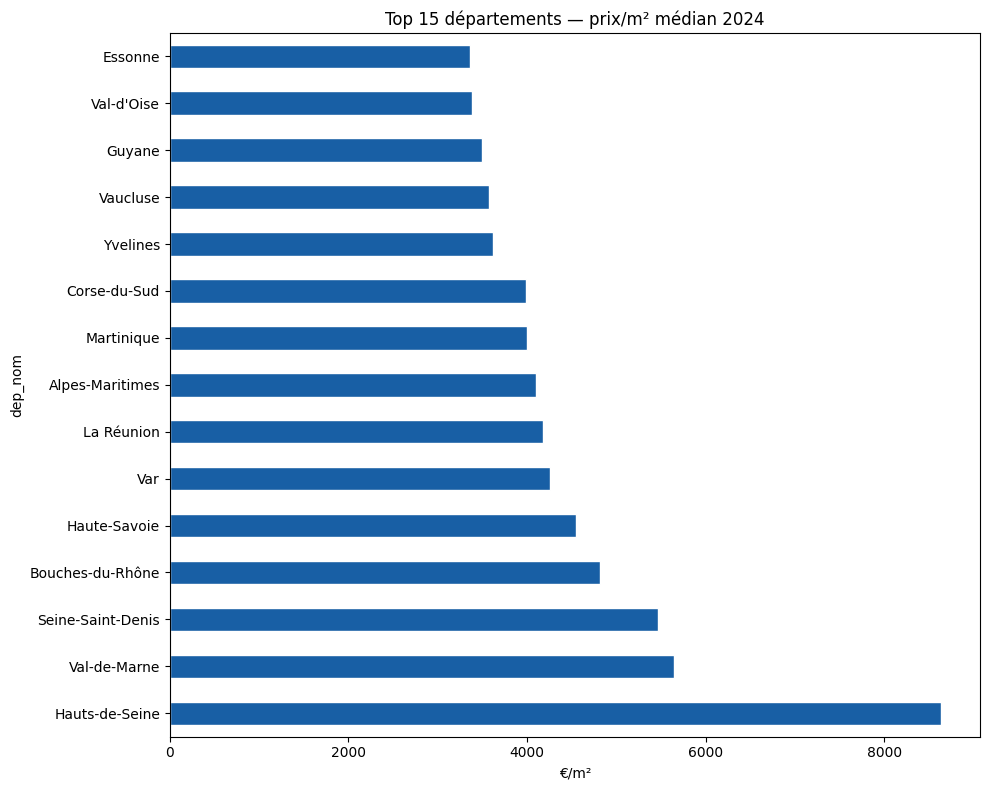

In [30]:
dep_prix = df_eda[df_eda['annee'] == 2025].groupby('dep_nom')['prix_m2'].median().dropna().sort_values()

top15 = dep_prix.tail(15)

fig, ax = plt.subplots(figsize=(10, 8))
top15.plot(kind='barh', ax=ax, color='#185FA5', edgecolor='white')

ax.set_title("Top 15 départements — prix/m² médian 2024")
ax.set_xlabel("€/m²")
ax.invert_yaxis() 

plt.tight_layout()
plt.show()

### 4.4 Taux de hausse/baisse par région (2025)

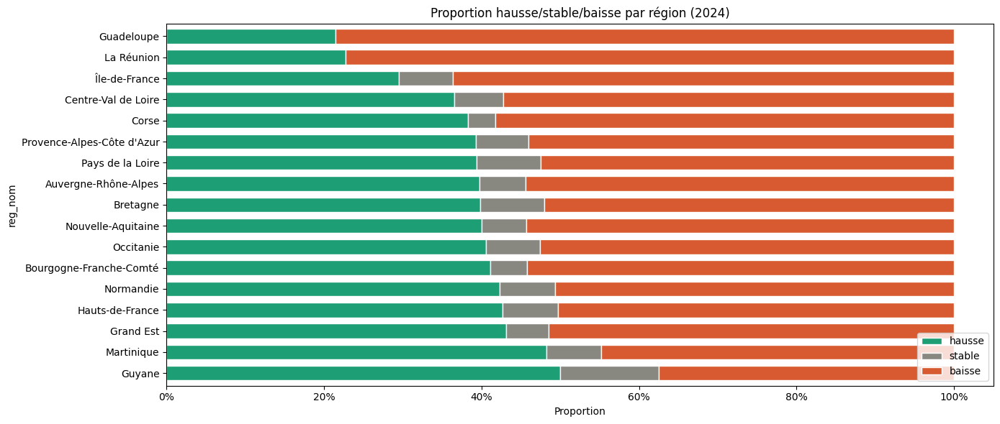

In [46]:
import matplotlib.ticker as mticker
y_region = (df_clean[df_clean['annee']==2025]
            .groupby('reg_nom')['y']
            .value_counts(normalize=True)
            .unstack(fill_value=0)
            .sort_values('hausse', ascending=False))

fig, ax = plt.subplots(figsize=(14, 6))
y_region[['hausse','stable','baisse']].plot(
    kind='barh', stacked=True, ax=ax,
    color=['#1D9E75','#888780','#D85A30'], edgecolor='white', width=0.7)
ax.set_title("Proportion hausse/stable/baisse par région (2024)")
ax.set_xlabel("Proportion")
ax.xaxis.set_major_formatter(mticker.PercentFormatter(xmax=1))
ax.legend(loc='lower right')
plt.tight_layout()
plt.show()


## 5. Matrice de corrélation

On mesure les corrélations entre les variables numériques et la cible y.

In [63]:
cols_to_check = ['code_commune', 'dep_code', 'reg_code', 'code_postal']
print(df_eda[cols_to_check].dtypes)

code_commune     object
dep_code         object
reg_code        float64
code_postal     float64
dtype: object


Corrélation avec la cible :
y_encoded                      1.000000
taux_inflation                 0.070156
prix_m2                        0.034279
superficie_km2                 0.018144
part_agriculture               0.016922
nb_ventes                      0.014721
part_construction              0.012892
code_postal                    0.011310
reg_code                       0.011168
dep_code                       0.010992
code_commune                   0.010963
zone_emploi                    0.008084
part_tertiaire_marchand        0.007331
emploi_non_salarie             0.003955
taux_global_th                 0.001881
emploi_total                   0.001475
loisirs_verts                  0.001231
emploi_salarie                 0.001071
commerces_malls                0.000242
population                    -0.001311
education                     -0.001497
part_industrie                -0.001877
transports_rails              -0.003323
taux_global_tfnb              -0.010774
part_tertiai

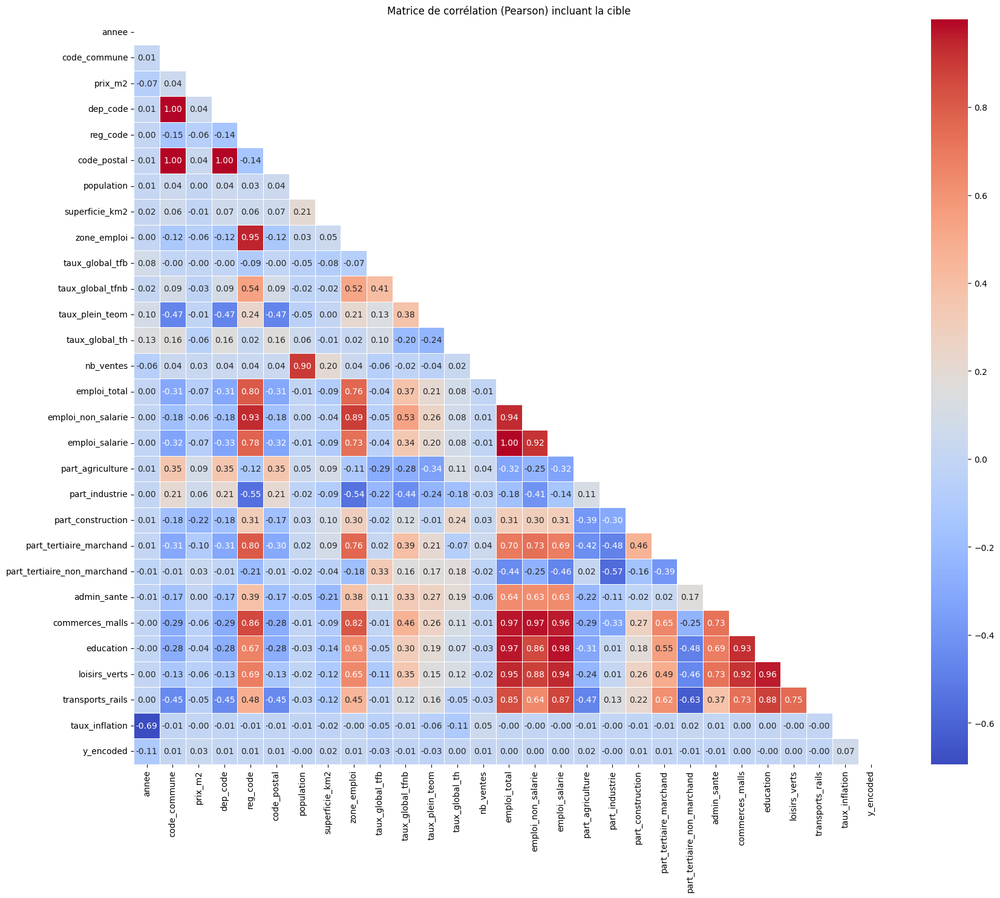

In [69]:
le = LabelEncoder()
df_eda['y_encoded'] = le.fit_transform(df_eda['y'])

# Liste des colonnes numériques
num_cols = ['annee', 'code_commune', 'prix_m2', 'dep_code', 'reg_code', 'code_postal',
            'population', 'superficie_km2', 'zone_emploi',
            'taux_global_tfb', 'taux_global_tfnb', 'taux_plein_teom',
            'taux_global_th', 'nb_ventes', 'emploi_total',
            'emploi_non_salarie', 'emploi_salarie', 'part_agriculture',
            'part_industrie', 'part_construction', 'part_tertiaire_marchand',
            'part_tertiaire_non_marchand', 'admin_sante',
            'commerces_malls', 'education', 'loisirs_verts', 'transports_rails',
            'taux_inflation']

corr_matrix = df_eda[num_cols + ['y_encoded']].corr(method='pearson')

corr_target = corr_matrix['y_encoded'].sort_values(ascending=False)
print("Corrélation avec la cible :")
print(corr_target)

plt.figure(figsize=(20, 16))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool)) 
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    linewidths=0.5,
    mask=mask
)
plt.title("Matrice de corrélation (Pearson) incluant la cible")
plt.show()

Les corrélations avec y sont très faibles

In [97]:
threshold = 0.8

corr_matrix_abs = corr_matrix.abs()
upper = corr_matrix_abs.where(np.triu(np.ones(corr_matrix_abs.shape), k=1).astype(bool))

high_corr_pairs = [
    (col1, col2, upper.loc[col1, col2])
    for col1 in upper.columns
    for col2 in upper.columns
    if upper.loc[col1, col2] > threshold
]

for var1, var2, corr in high_corr_pairs:
    print(f"{var1} ↔ {var2} : {corr:.2f}")

code_commune ↔ dep_code : 1.00
code_commune ↔ code_postal : 1.00
dep_code ↔ code_postal : 1.00
reg_code ↔ zone_emploi : 0.95
reg_code ↔ emploi_total : 0.80
reg_code ↔ emploi_non_salarie : 0.93
reg_code ↔ part_tertiaire_marchand : 0.80
reg_code ↔ commerces_malls : 0.86
population ↔ nb_ventes : 0.90
zone_emploi ↔ emploi_non_salarie : 0.89
zone_emploi ↔ commerces_malls : 0.82
emploi_total ↔ emploi_non_salarie : 0.94
emploi_total ↔ emploi_salarie : 1.00
emploi_total ↔ commerces_malls : 0.97
emploi_total ↔ education : 0.97
emploi_total ↔ loisirs_verts : 0.95
emploi_total ↔ transports_rails : 0.85
emploi_non_salarie ↔ emploi_salarie : 0.92
emploi_non_salarie ↔ commerces_malls : 0.97
emploi_non_salarie ↔ education : 0.86
emploi_non_salarie ↔ loisirs_verts : 0.88
emploi_salarie ↔ commerces_malls : 0.96
emploi_salarie ↔ education : 0.98
emploi_salarie ↔ loisirs_verts : 0.94
emploi_salarie ↔ transports_rails : 0.87
commerces_malls ↔ education : 0.93
commerces_malls ↔ loisirs_verts : 0.92
educati

In [105]:
df_eda.columns

Index(['annee', 'code_commune', 'prix_m2', 'dep_code', 'dep_nom', 'reg_code',
       'reg_nom', 'code_postal', 'population', 'superficie_km2', 'zone_emploi',
       'taux_global_tfb', 'taux_global_tfnb', 'taux_plein_teom',
       'taux_global_th', 'nb_ventes', 'variation', 'y', 'emploi_total',
       'emploi_non_salarie', 'emploi_salarie', 'part_agriculture',
       'part_industrie', 'Construction ', 'part_tertiaire_marchand',
       'part_tertiaire_non_marchand', 'region', 'admin_sante',
       'commerces_malls', 'education', 'loisirs_verts', 'transports_rails',
       'taux_inflation'],
      dtype='object')

In [ ]:
service_cols = ['admin_sante', 'commerces_malls', 'education', 'loisirs_verts', 'transports_rails']

df_eda['lieu_interet'] = df_eda[service_cols].sum(axis=1)

cols_to_drop = service_cols + ['code_postal']
df_eda = df_eda.drop(columns=cols_to_drop)


cols_to_keep = [
    'annee','prix_m2','code_commune', 'reg_code', 'population', 'superficie_km2',
    'emploi_total', 'part_agriculture', 'part_industrie', 'Construction ',
    'part_tertiaire_marchand', 'part_tertiaire_non_marchand',
    'taux_global_tfb', 'taux_global_tfnb', 'taux_plein_teom', 'taux_global_th',
    'lieu_interet', 'emploi_total']

df_eda = df_eda[cols_to_keep]